In [1]:
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.inception_v3 import preprocess_input
from keras.utils.data_utils import GeneratorEnqueuer
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np 
import math, os

%matplotlib inline

C:\Users\user\Anaconda3\envs\tensorflow\lib\site-packages\h5py\__init__.py:72: UserWarning: h5py is running against HDF5 1.10.1 when it was built against 1.10.2, this may cause problems
  '{0}.{1}.{2}'.format(*version.hdf5_built_version_tuple)
Using TensorFlow backend.


In [10]:
image_path = "./test/"

batch_size = 100
img_generator = ImageDataGenerator().flow_from_directory(image_path, shuffle=False, batch_size = batch_size)
n_rounds = math.ceil(img_generator.samples / img_generator.batch_size)
filenames = img_generator.filenames

img_generator = GeneratorEnqueuer(img_generator)
img_generator.start()
img_generator = img_generator.get()

Found 99999 images belonging to 1 classes.


# with YOLOv2

In [22]:
from darkflow.net.build import TFNet
import cv2

In [23]:
options = {"model": "cfg/yolo.cfg", "load": "bin/yolo.weights", "threshold": 0.5, "gpu": 1.0}
tfnet = TFNet(options)

Parsing ./cfg/yolo.cfg
Parsing cfg/yolo.cfg
Loading bin/yolo.weights ...
Successfully identified 203934260 bytes
Finished in 0.01698136329650879s
Model has a coco model name, loading coco labels.

Building net ...
Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------
       |        | input                            | (?, 608, 608, 3)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 608, 608, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 304, 304, 32)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 304, 304, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 152, 152, 64)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Load  |  Yep!  | conv 1x1p0_1  +bnorm  leaky      | (?, 152, 152, 64)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 76, 76, 128)
 Load  |  Yep!

In [24]:
def boxing(original_img, predictions):
    newImage = np.copy(original_img)

    for result in predictions:
        top_x = result['topleft']['x']
        top_y = result['topleft']['y']

        btm_x = result['bottomright']['x']
        btm_y = result['bottomright']['y']

        confidence = result['confidence']
        label = result['label'] + " " + str(round(confidence, 3))

        if confidence > 0.3:
            newImage = cv2.rectangle(newImage, (top_x, top_y), (btm_x, btm_y), (255,0,0), 3)
            newImage = cv2.putText(newImage, label, (top_x, top_y-5), cv2.FONT_HERSHEY_COMPLEX_SMALL , 0.8, (0, 230, 0), 1, cv2.LINE_AA)
            
    return newImage

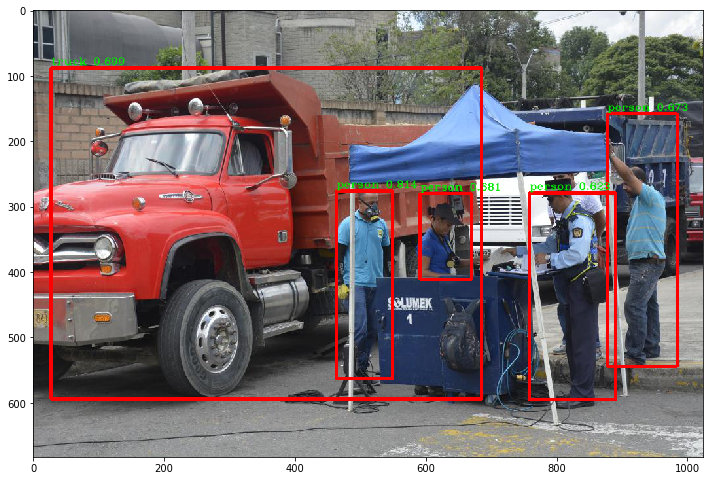

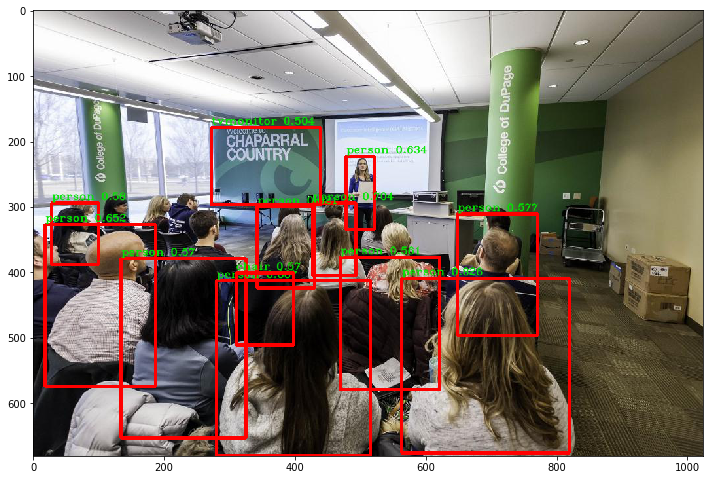

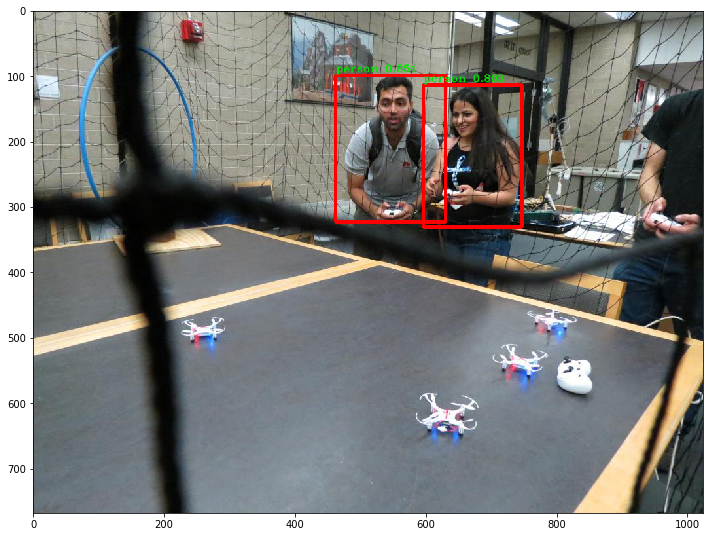

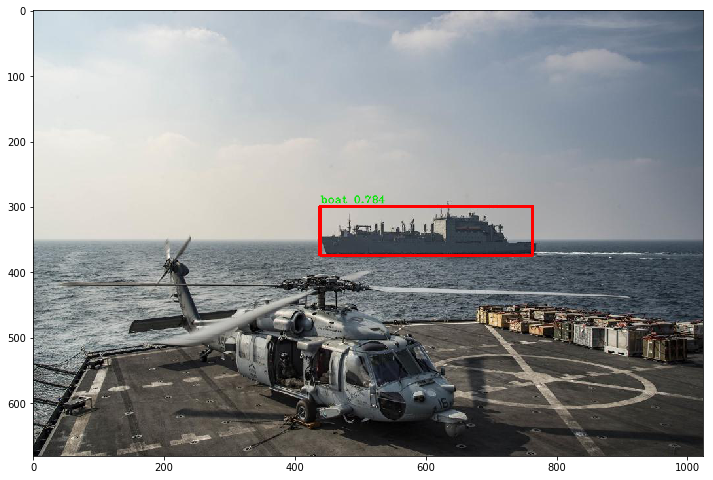

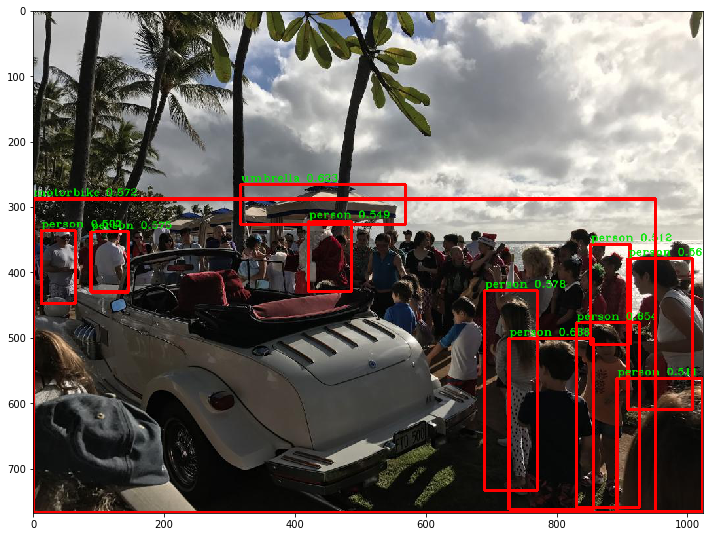

...

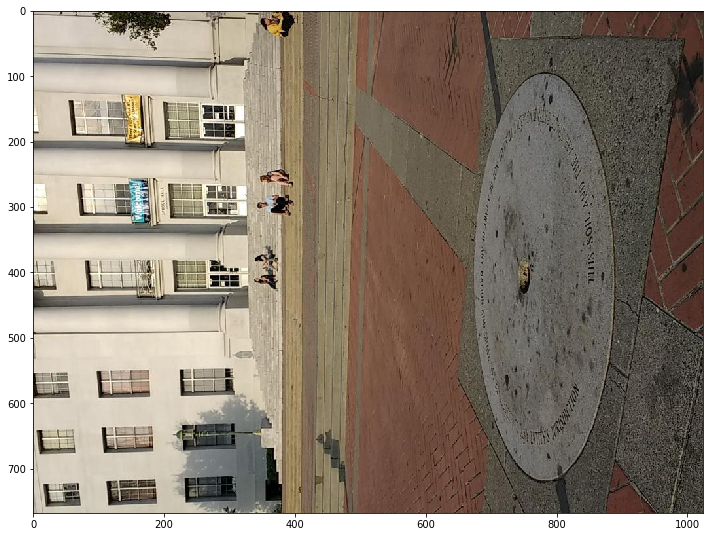

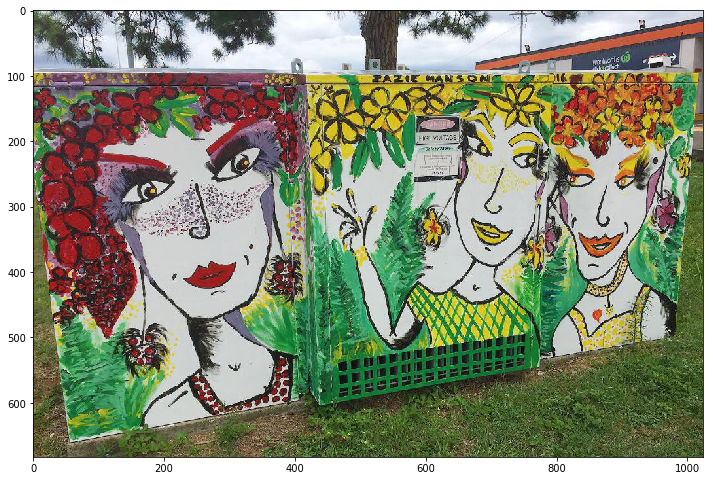

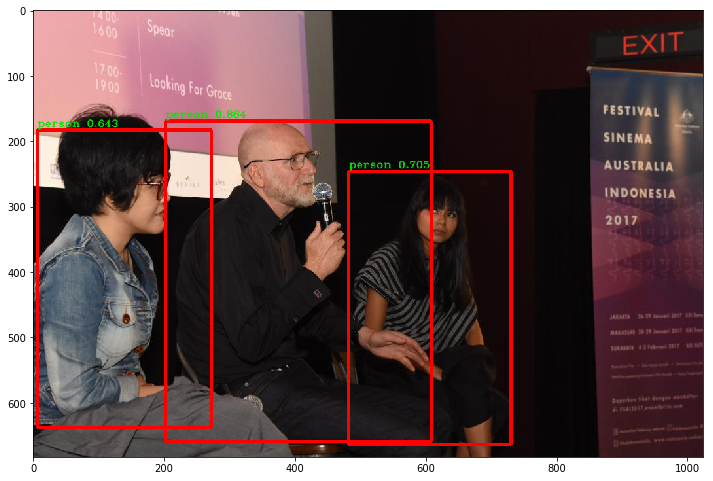

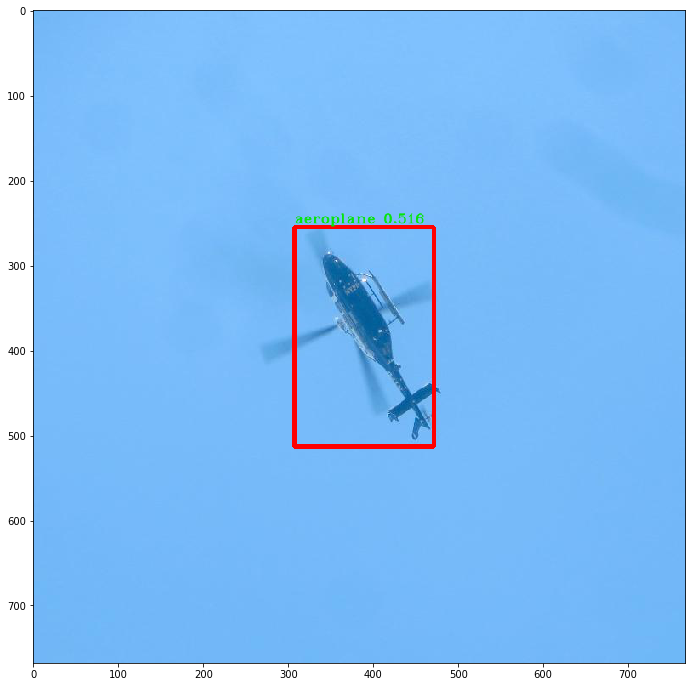

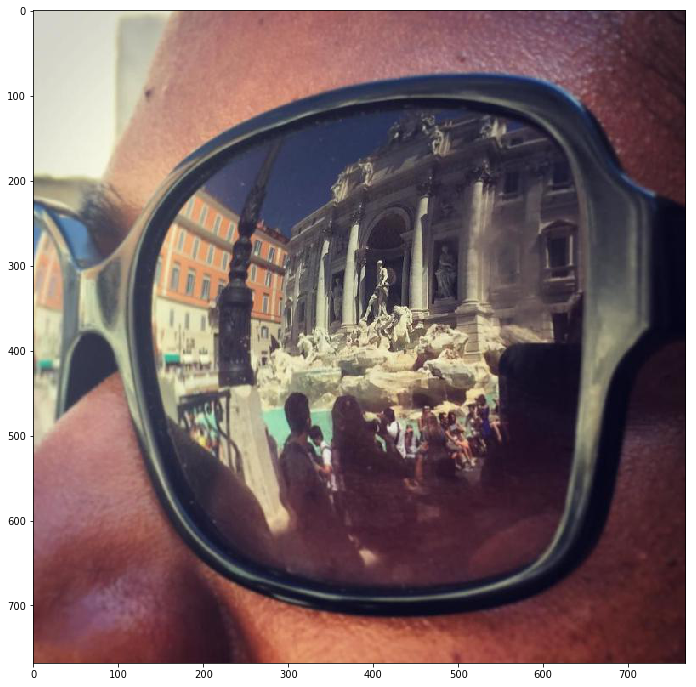

In [36]:
for i in range(n_rounds):
    batch = next(img_generator)
    for j, prediction in enumerate(batch):
        image = filenames[i * batch_size + j]
        origianl_image = cv2.imread('./test/' + image)
        origianl_image = cv2.cvtColor(origianl_image, cv2.COLOR_BGR2RGB)
        
        results = tfnet.return_predict(origianl_image)

#         pred_str = ""
#         labels = ""
#         for eachObject in results:    
#             pred_str += rev[eachObject["label"]] + " " + str(float(eachObject["confidence"])/100) + " 0.1 0.1 0.9 0.9"
#             pred_str += " "
#             labels += eachObject['label'] + ", " + str(round(float(eachObject['confidence'])/100, 1)) 
#             labels += " | "
            
#         if labels != "":
        plt.figure(figsize=(12,12))
        plt.imshow(boxing(origianl_image, results))
        plt.show()

#         print ("Labels Detected: ")
#         print (labels)
#         print ()
#         print ("Prediction String: ")
#         print (pred_str)

    if i == 10:
        break

# with Faster R-CNN

In [26]:
from lib.fast_rcnn.config import cfg


In [27]:
def parse_args():
    """Parse input arguments."""
    parser = argparse.ArgumentParser(description='Faster R-CNN demo')
    parser.add_argument('--gpu', dest='gpu_id', help='GPU device id to use [0]',
                        default=0, type=int)
    parser.add_argument('--cpu', dest='cpu_mode',
                        help='Use CPU mode (overrides --gpu)',
                        action='store_true')
    parser.add_argument('--net', dest='demo_net', help='Network to use [vgg16]',
                        default='VGGnet_test')
    parser.add_argument('--model', dest='model', help='Model path',
                        default=' ')

    args = parser.parse_args()

    return args

In [29]:
cfg.TEST.HAS_RPN = True  # Use RPN for proposals
args = parse_args()

usage: ipykernel_launcher.py [-h] [--gpu GPU_ID] [--cpu] [--net DEMO_NET]
                             [--model MODEL]
ipykernel_launcher.py: error: unrecognized arguments: -f C:\Users\user\AppData\Roaming\jupyter\runtime\kernel-89aa5437-444b-4904-8264-ad714216831e.json


SystemExit: 2

C:\Users\user\Anaconda3\envs\tensorflow\lib\site-packages\IPython\core\interactiveshell.py:2971: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [31]:
import tensorflow as tf

In [32]:
sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True))

In [36]:
from lib.networks.factory import get_network
net = get_network(args.demo_net)

NotFoundError: C:\Users\user\Documents\test\lib\roi_pooling_layer\roi_pooling.so not found